In [1]:
%load_ext autoreload
%autoreload 2

In [12]:
import os
import pickle
import pandas as pd
import numpy as np
from PIL import Image
from omegaconf import OmegaConf

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from brokenaxes import brokenaxes

In [ ]:
from curve_utils import pick_same_index_across_lists
from curve_utils import get_all_curves
import random

In [3]:

color_groups = {
    'dino_nako': '#000000', 'dino_meta': '#05771D', 'retfound': '#90A4AE',
    'nako_mae': '#6A1B9A', 'simclr_inet_nako': '#D81B60', 'simclr_nako': '#F3D0DC',
    'scratch': '#1565C0', 'resnet_imagenet': '#42A5F5',
}
new_names = {
    'dino_nako': 'DINOv2 NAKO', 'dino_meta': 'DINOv2 LVD', 'retfound': 'RETFound',
    'resnet_imagenet': 'ResNet INet', 'nako_mae': "MAE NAKO", 'simclr_nako': 'SimCLR NAKO',
    'simclr_inet_nako': 'SimCLR INet NAKO', 'scratch': "ResNet Scratch"
}
info_dict = [
        {'freeze_encoder': 1, 'train_size': 500, 'has_event': True},
        {'freeze_encoder': 1, 'train_size': 30000, 'has_event': True},

        {'freeze_encoder': 0, 'train_size': 500, 'has_event': True},
        {'freeze_encoder': 0, 'train_size': 30000, 'has_event': True},

            ]

In [ ]:
project_dir = '/gpfs01/berens/user/inwabufo/leverage/leverage-data'

CLEANED_FILE = 'areds_new_results_cleaned_03_06_26_split_id_11042026.csv'
metadata_dir = os.path.join(project_dir, 'metadata')
log_dir = 'log_dir'
hostname_ = 'CIN'
dataset_name = 'areds_new'
split_id = 11042026

config_file = '/gpfs01/berens/user/inwabufo/.secrets.yaml'
cfg = OmegaConf.load(config_file)
stylef = cfg['stylef'][hostname_]
CHKPT_DIR = chkpt_dir = os.path.join(project_dir, 'chkpt_dir', 'npj_areds_curves')
RESULTS_DIR = os.path.join(project_dir, 'results')
project_dir = cfg['DATASETS'][hostname_][dataset_name]
stylef = cfg['stylef'][hostname_]
img_dir = f"{project_dir}"
img_dir

'/gpfs01/berens/user/inwabufo/data/AREDS/AREDS_macula'

In [5]:
or_df = pd.read_csv(os.path.join(log_dir, f'{CLEANED_FILE}'))
print(or_df.shape)
or_df.head(2)

(1120, 71)


,Name,State,Notes,User,Tags,Created,Runtime,Sweep,backbone_model_str,batch_size,...,val/brier_score_t4,val/brier_score_t6,val/brier_score_t8,val/brier_scores,val/concordance_index,val/ibs,val/ibs_best,val/mean_auroc,val/mean_auroc_best,summary
0,testrun_False_FE_False_100_linear_2026-06-15_1...,finished,-,NaN,NaN,2026-06-15T14:08:16.000Z,5317,NaN,simclr_inet_nako,8,...,0.070489,0.084390,0.098673,"[0.055670785775393986,0.0704893362169278,0.084...",0.763673,0.084360,0.084258,0.772707,0.762622,simclr_inet_nako
1,testrun_False_FE_False_100_linear_2026-06-15_1...,finished,-,NaN,NaN,2026-06-15T12:23:46.000Z,6238,NaN,simclr_inet_nako,8,...,0.066882,0.077552,0.088270,"[0.05255887579501174,0.06688229519199841,0.077...",0.820761,0.077198,0.077987,0.829780,0.825683,simclr_inet_nako


In [6]:
metadata_df = pd.read_csv(os.path.join(metadata_dir,'surv_jul_data0_11_04_26.csv'))
metadata_df.head()

patient_identifier= 'patient_id'
SPLIT_ID = 11042026
split_ids_file = os.path.join(metadata_dir, f"splits_patient-ids-{SPLIT_ID}.pkl")
dict_seed_splits_patientids = pickle.load(open(split_ids_file, "rb"))
# get the test set
test = metadata_df[metadata_df[patient_identifier].isin(dict_seed_splits_patientids[SPLIT_ID]["test"])].reset_index(drop=True)
test.head()

/tmp/ipykernel_722611/3305201377.py:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  metadata_df = pd.read_csv(os.path.join(metadata_dir,'surv_jul_data0_11_04_26.csv'))


,patient_id,eye_id,image_id,visit_number,image_eye,image_field,image_side,image_file,image_path,diagnosis_amd_grade,...,clinical_treatment_category,clinical_laser_photocoagulation_right,clinical_laser_photocoagulation_left,diagnosis_final_amd_status,clinical_centrum_intake,patient_age,sequence_id,observation_id,duration,event
0,1006,1006_left,1006_left_RS_04,4,left,F2,RS,55353_04_F2_LE_RS.jpg,55353/55353_04_F2_LE_RS.jpg,1.0,...,4.0,N,N,14.0,N,69.3,1006_left,1006_left_4,18,0
1,1006,1006_left,1006_left_LS_06,6,left,F2,LS,55353_06_F2_LE_LS.jpg,55353/55353_06_F2_LE_LS.jpg,2.0,...,4.0,N,N,14.0,N,70.3,1006_left,1006_left_6,16,0
2,1006,1006_left,1006_left_RS_08,8,left,F2,RS,55353_08_F2_LE_RS.jpg,55353/55353_08_F2_LE_RS.jpg,1.0,...,4.0,N,N,14.0,N,71.3,1006_left,1006_left_8,14,0
3,1006,1006_left,1006_left_RS_10,10,left,F2,RS,55353_10_F2_LE_RS.jpg,55353/55353_10_F2_LE_RS.jpg,1.0,...,4.0,N,N,14.0,N,72.2,1006_left,1006_left_10,12,0
4,1006,1006_left,1006_left_RS_12,12,left,F2,RS,55353_12_F2_LE_RS.jpg,55353/55353_12_F2_LE_RS.jpg,1.0,...,4.0,N,N,14.0,N,73.2,1006_left,1006_left_12,10,0


In [15]:
def get_event_sample(test, has_event=True, n_img=5):
    """Selects candidate patients based on has_event, independent of model config."""
    test = test.copy()
    test['converter'] = test['diagnosis_amd_grade'].apply(lambda x: x in [10, 11, 12])
    test_grp = test.sort_values(['visit_number']).groupby(['eye_id', 'image_eye']).agg(list)
    test_grp['n_img'] = test_grp['image_side'].apply(lambda x: len(x))
    test_grp['has_event'] = test_grp['event'].apply(lambda x: 1 in x)

    sample_ = test_grp[(test_grp['n_img'] == n_img) &
                        (test_grp['has_event'] == has_event)].reset_index(drop=False)
    return sample_

In [16]:
def plot_one_image_curve(or_df, sample_, model_row_index, freeze_encoder=1,
                          train_size=500, num_images=None, CHKPT_DIR=''):
    """
    sample_: precomputed patient candidates (from get_event_sample), shared across calls
    model_row_index: the FIXED row index in sample_ to use — same patient reused
                      across different freeze_encoder / train_size combos
    """
    dfl = or_df[(or_df['freeze_encoder'] == freeze_encoder) &
                (or_df['survival_head'] == 'mlp') &
                (or_df['train_size'] == train_size)]
    dfl_ssl = dfl.groupby(['weights_path']).agg(list)

    dfl_ssl['model'] = dfl_ssl['summary'].apply(lambda x: x[0])
    model_list = sorted(list(dfl_ssl['model'].unique()))
    dfl_ssl['best_idx'] = dfl_ssl['test/ibs'].apply(lambda x: np.argmin(np.array(x)))
    dfl_ssl['best_result'] = dfl_ssl.apply(lambda row: row['Name'][row['best_idx']], axis=1)

    all_images_to_plot = sample_.loc[
        model_row_index, ['image_path', 'diagnosis_amd_grade', 'patient_id',
                           "eye_id", "visit_number", "converter"]
    ].copy()
    all_images_to_plot['train_size'] = train_size

    all_images_to_plot = pick_same_index_across_lists(all_images_to_plot, num_images=num_images)
    curves_dict = get_all_curves(all_images_to_plot, model_list, dfl_ssl, CHKPT_DIR)

    return curves_dict, all_images_to_plot, train_size

In [7]:


def draw_curves_grid_simple(records, image_dir=None, show_images=False,
                             n_rows=4, n_cols=4, save_path=None, stylef=None):
    n_patients = len(records)
    y_min = min(min(curve) for r in records for curve in r['curves'].values()) - 0.02
    y_max = 1

    with plt.style.context(stylef):
        # ── Build ONE figure + ONE grid layout, regardless of show_images ──
        if show_images:
            fig = plt.figure(figsize=((n_cols + 1) * 3, n_rows * 2.5))
            outer_gs = gridspec.GridSpec(n_rows, n_cols + 1, figure=fig,
                                          width_ratios=[1] * n_cols + [1.3],
                                          wspace=0.2, hspace=0.6)
        else:
            fig = plt.figure(figsize=(n_cols * 3, n_rows * 2.5))
            outer_gs = gridspec.GridSpec(n_rows, n_cols, figure=fig,
                                          wspace=0.3, hspace=0.6)

        for p, rec in enumerate(records):
            row, col_in_row = divmod(p, n_cols)
            cell = outer_gs[row, col_in_row]

            bax = brokenaxes(
                xlims=((-0.1, 0.002), (0.9, 5.1)),
                hspace=0.01, d=0.005, tilt=45,
                subplot_spec=cell,
                fig=fig
            )

            for model, curve in rec['curves'].items():
                bax.plot(range(1, len(curve) + 1), curve,
                          label=new_names.get(model, model),
                          color=color_groups.get(model), linewidth=1.5)

            title = (f"ID {rec['patient_id']}\n"
                      f"freeze={rec['freeze_encoder']} n={rec['train_size']} evt={rec['has_event']}")
            bax.set_title(title, fontsize=8)
            bax.set_ylim(y_min, y_max)
            bax.axs[1].set_yticks([0, 0.5, 1])
            bax.axs[0].set_xticks([])
            bax.axs[1].set_xticks([1, 2, 3, 4, 5])

            # restore visible left spine/ticks on the baseline mini-axis
            bax.axs[0].spines['left'].set_visible(True)
            bax.axs[0].tick_params(left=True, labelleft=True)

            for a in bax.axs:
                a.tick_params(axis='both', labelsize=7)

            if col_in_row == 0:
                bax.set_ylabel('S(t)', fontsize=9)
            if row == n_rows - 1:
                bax.set_xlabel('Year', fontsize=9)

            # ── image block for this row, drawn once after last curve column ──
            if show_images and col_in_row == n_cols - 1:
                img_gs = gridspec.GridSpecFromSubplotSpec(
                    2, 2, subplot_spec=outer_gs[row, n_cols], wspace=0.05, hspace=0.05
                )
                row_records = records[row * n_cols: row * n_cols + n_cols]
                for k, r in enumerate(row_records):
                    img_ax = fig.add_subplot(img_gs[k // 2, k % 2])
                    img_path = os.path.join(image_dir, f"R_{r['image_path']}")
                    img_ax.imshow(Image.open(img_path))
                    img_ax.axis('off')

        # ── One shared legend, built independently of any specific axis ──
        handles = [plt.Line2D([0], [0], color=color_groups[m], linewidth=1.5) for m in color_groups]
        labels = [new_names[m] for m in color_groups]
        fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.4, 0.98),
                   ncol=4, fontsize=9)

        plt.tight_layout()
        fig.subplots_adjust(bottom=0.15)

    if save_path is not None:
        plt.savefig(f'{save_path}/surv_curves_grid.pdf', bbox_inches='tight')
    plt.show()

In [19]:

def get_records(test, has_event = True):
    n_patients = 2
    sample_ = get_event_sample(test, has_event=has_event, n_img=5)
    patient_row_indices = random.sample(range(len(sample_)), n_patients)
    print('patient_row_indices', patient_row_indices)

    configs = [
        {'freeze_encoder': 1, 'train_size': 500},
        {'freeze_encoder': 1, 'train_size': 30000},
        {'freeze_encoder': 0, 'train_size': 500},
        {'freeze_encoder': 0, 'train_size': 30000},
    ]

    records = []
    for row_idx in patient_row_indices:            # outer: patient
        for cfg in configs:                        # inner: freeze x train_size (2x2 grid)
            freeze_encoder = cfg['freeze_encoder']
            train_size = cfg['train_size']

            dict1, img_to_plot, _ = plot_one_image_curve(
                or_df, sample_, model_row_index=row_idx,
                freeze_encoder=freeze_encoder, train_size=train_size,
                num_images=2, CHKPT_DIR=CHKPT_DIR
            )

            records.append({
                'freeze_encoder': freeze_encoder,
                'train_size': train_size,
                'has_event': True,
                'patient_id': img_to_plot['patient_id'][0] if isinstance(img_to_plot['patient_id'], list) else img_to_plot['patient_id'],
                'eye_id': img_to_plot['eye_id'][0] if isinstance(img_to_plot['eye_id'], list) else img_to_plot['eye_id'],
                'image_path': img_to_plot['image_path'][0] if isinstance(img_to_plot['image_path'], list) else img_to_plot['image_path'],
                'diagnosis_amd_grade': img_to_plot['diagnosis_amd_grade'][0] if isinstance(img_to_plot['diagnosis_amd_grade'], list) else img_to_plot['diagnosis_amd_grade'],
                'visit_number': img_to_plot['visit_number'][0] if isinstance(img_to_plot['visit_number'], list) else img_to_plot['visit_number'],
                'curves': {model: curve[0] for model, curve in dict1.items()},
            })
    return records

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


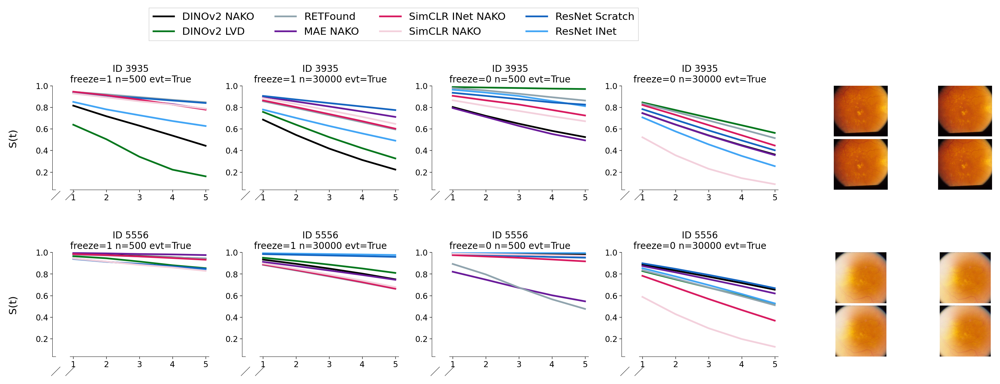

In [18]:
draw_curves_grid_simple(records, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [19, 18]
image_path             [53622/53622_10_F2_RE_RS.jpg, 53622/53622_12_F...
diagnosis_amd_grade                                          [8.0, 11.0]
patient_id                                                  [G255, G255]
eye_id                                                        G255_right
visit_number                                                    [10, 12]
converter                                                  [False, True]
train_size                                                           500
Name: 19, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                     

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


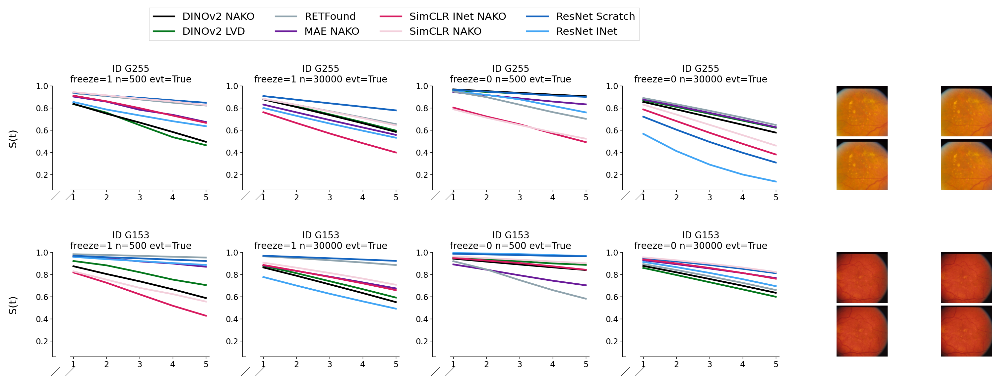

In [20]:
records1 = get_records(test, has_event = True)

draw_curves_grid_simple(records1, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [19, 4]
image_path             [53622/53622_10_F2_RE_RS.jpg, 53622/53622_12_F...
diagnosis_amd_grade                                          [8.0, 11.0]
patient_id                                                  [G255, G255]
eye_id                                                        G255_right
visit_number                                                    [10, 12]
converter                                                  [False, True]
train_size                                                           500
Name: 19, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                      

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


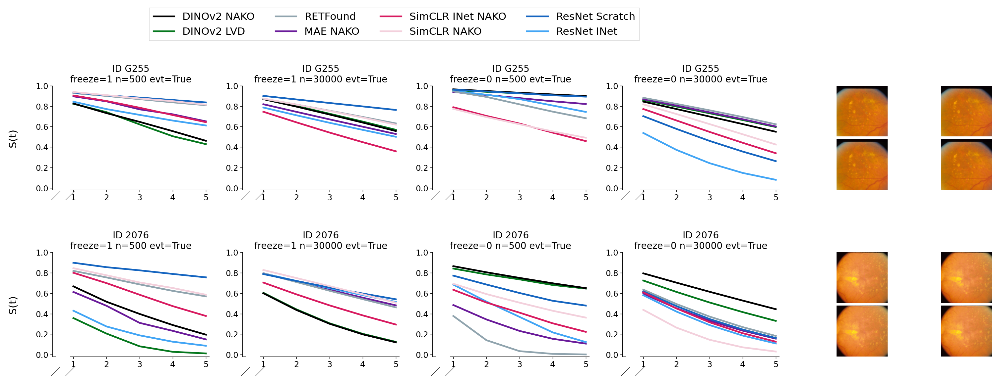

In [21]:
records2 = get_records(test, has_event = True)

draw_curves_grid_simple(records2, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [16, 17]
image_path             [52873/52873_10_F2_LE_RS.jpg, 52873/52873_12_F...
diagnosis_amd_grade                                          [6.0, 11.0]
patient_id                                                  [5556, 5556]
eye_id                                                         5556_left
visit_number                                                    [10, 12]
converter                                                  [False, True]
train_size                                                           500
Name: 16, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                     

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


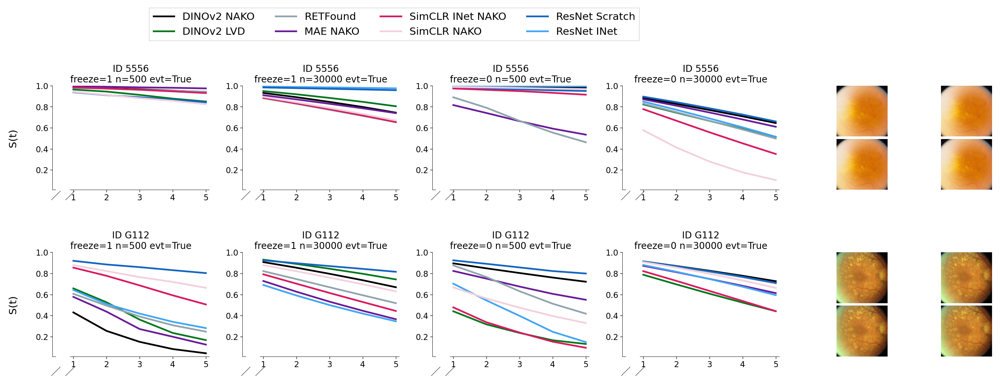

In [22]:
records3 = get_records(test, has_event = True)

draw_curves_grid_simple(records3, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [14, 13]
image_path             [58462/58462_10_F2_RE_RS.jpg, 58462/58462_12_F...
diagnosis_amd_grade                                          [6.0, 11.0]
patient_id                                                  [4937, 4937]
eye_id                                                        4937_right
visit_number                                                    [10, 12]
converter                                                  [False, True]
train_size                                                           500
Name: 14, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                     

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


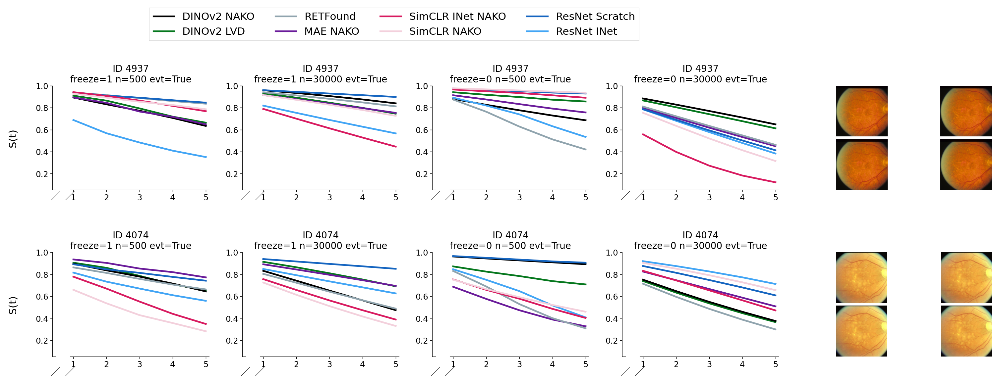

In [23]:
records4 = get_records(test, has_event = True)

draw_curves_grid_simple(records4, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [12, 13]
image_path             [53331/53331_06_F2_RE_LS.jpg, 3935/3935_08_RE_...
diagnosis_amd_grade                                          [9.0, 10.0]
patient_id                                                  [3935, 3935]
eye_id                                                        3935_right
visit_number                                                      [6, 8]
converter                                                  [False, True]
train_size                                                           500
Name: 12, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                     

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


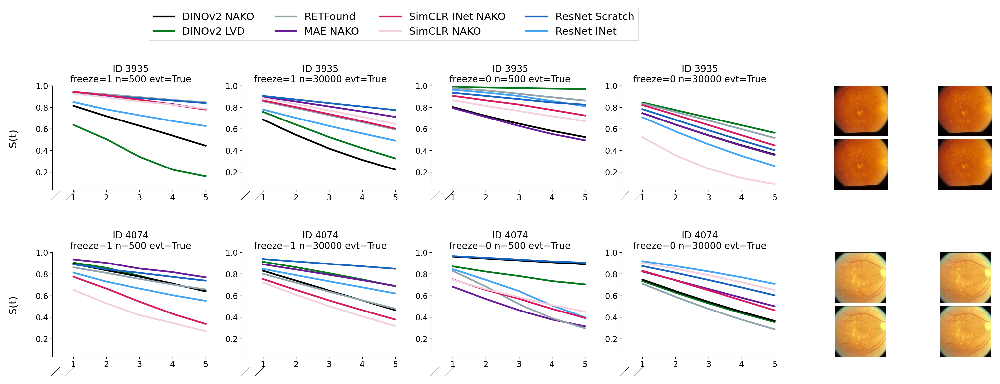

In [27]:
records5 = get_records(test, has_event = True)

draw_curves_grid_simple(records5, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [13, 12]
image_path             [4074/4074_08_RE_F2_LS.jpg, 4074/4074_10_RE_F2...
diagnosis_amd_grade                                          [7.0, 11.0]
patient_id                                                  [4074, 4074]
eye_id                                                        4074_right
visit_number                                                     [8, 10]
converter                                                  [False, True]
train_size                                                           500
Name: 13, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                     

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


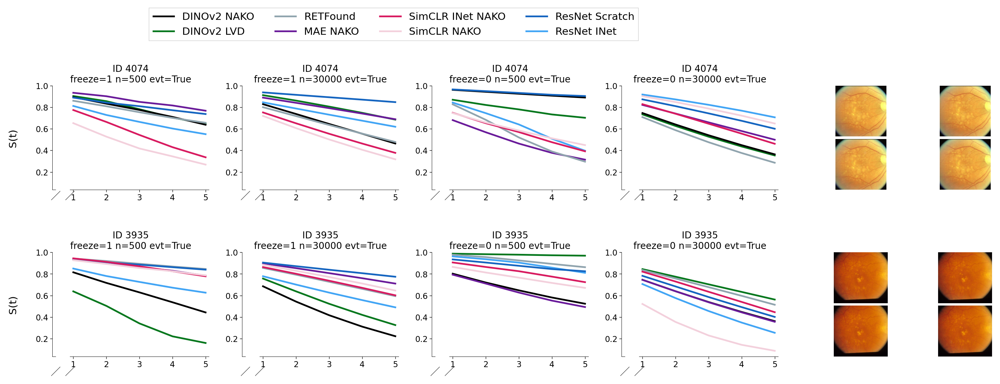

In [30]:
records6 = get_records(test, has_event = True)

draw_curves_grid_simple(records6, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)

patient_row_indices [4, 15]
image_path             [55319/55319_10_F2_LE_RS.jpg, 55319/55319_12_F...
diagnosis_amd_grade                                          [9.0, 11.0]
patient_id                                                  [2076, 2076]
eye_id                                                         2076_left
visit_number                                                    [10, 12]
converter                                                  [False, True]
train_size                                                           500
Name: 4, dtype: object
                                                           Name  \
weights_path                                                      
dino_meta     [testrun_False_FE_True_500_mlp_2026-06-11_04-4...   
dino_nako     [testrun_False_FE_True_500_mlp_2026-06-09_03-1...   
nako_mae      [testrun_False_FE_True_500_mlp_2026-06-10_21-4...   

                                                          State  \
weights_path                       

/tmp/ipykernel_722611/4221792640.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
/tmp/ipykernel_722611/4221792640.py:73: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


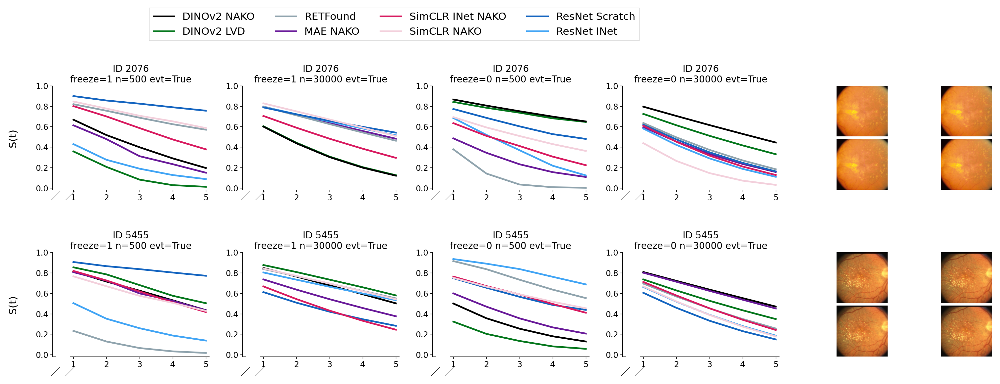

In [33]:
records7 = get_records(test, has_event = True)

draw_curves_grid_simple(records7, image_dir=img_dir, 
                        show_images=True,
                         save_path=RESULTS_DIR, stylef=stylef)